# DDPM 展示

In [6]:
!pip install fire pydantic tqdm

  Using cached annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
   ---------------------------------------- 0.0/2.0 MB ? eta -:--:--
   ------------------------------- -------- 1.6/2.0 MB 7.6 MB/s eta 0:00:01
   ---------------------------------------- 2.0/2.0 MB 7.4 MB/s eta 0:00:00
Using cached annotated_types-0.7.0-py3-none-any.whl (13 kB)


## 讀取隨機產生的瑞士卷形狀資料

In [1]:
from sklearn.datasets import make_swiss_roll

N = 1 << 10 # 1024
X = make_swiss_roll(n_samples=N, noise=1e-1)[0][:, [0, 2]] / 10.0
X.shape

(1024, 2)

## 繪圖

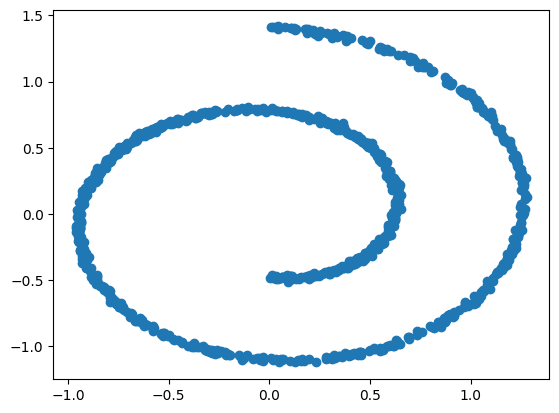

In [2]:
import matplotlib.pyplot as plt

plt.scatter(X[:, 0], X[:, 1])

## DDPM 訓練

Creating model
Training


Iter: 3190. Average Loss: 0.6570: 100%|██████████████████████████████████████████| 3200/3200 [00:29<00:00, 107.82it/s]


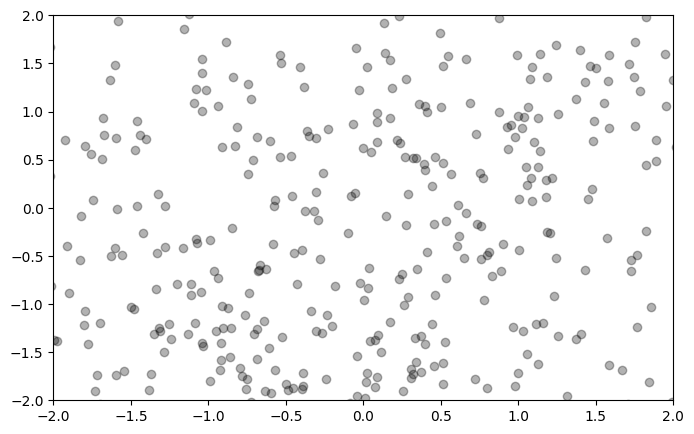

In [7]:
from diffusers import DDPM
from models import BasicDiscreteTimeModel
from main import train, animate

# 參數設定
d_model = 128
n_layers = 2
batch_size = 128
n_epochs = 400
sample_size = 512
steps_between_sampling = 20
seed = 42
n_steps = 100

print("Creating model")
model = BasicDiscreteTimeModel(d_model=d_model, n_layers=n_layers)
ddpm = DDPM(n_steps=n_steps)

print("Training")
result = train(
    model=model,
    ddpm=ddpm,
    batch_size=batch_size,
    n_epochs=n_epochs,
    sample_size=sample_size,
    steps_between_sampling=steps_between_sampling,
    seed=seed,
)
# 產生動畫
anim = animate(result.samples, save=False)

## 顯示訓練過程的動畫

In [8]:
from IPython.display import HTML
HTML(anim.to_jshtml())